## Albany Sanitary Sewer Network Analysis

Original by Riya Sharma with modifications by Veronica Li Aguirre

In [10]:
import geopandas as gpd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import contextily as ctx
import os

In [11]:
manhole_data = gpd.read_file('/home/veronica/data/Albany_Sewer/Sewer_Manhole.shx')

In [12]:
num_features = len(manhole_data)
print(f"Number of features in the shapefile: {num_features}")

Number of features in the shapefile: 894


In [13]:
# Identify the CRS of the sewer main shapefile
print(manhole_data.crs)

EPSG:3857


In [14]:
# List all attributes (columns) of the sewer main shapefile
print(manhole_data.columns)

Index(['SysID', 'AssetID', 'SubType', 'TypeDescri', 'ManholeCov', 'ManholeOpe',
       'ManholeBar', 'RimElevati', 'BottomElev', 'Depth', 'Location',
       'MapGrid', 'SubBasin', 'Intercepto', 'OriginalYe', 'YearInstal',
       'LastInspec', 'IsLined', 'OwnedBy', 'Maintained', 'SourceDocu',
       'ProjectNum', 'ProjectNam', 'HasGPSPoin', 'Operationa', 'DateAbando',
       'SymbolRota', 'Comments', 'DocumentUR', 'CreatedDat', 'CreatedBy',
       'LastUpdate', 'LastEditor', 'RevisionNo', 'GeometryIs', 'Attributes',
       'Unresolved', 'Enabled', 'GlobalID', 'geometry'],
      dtype='object')


In [15]:
main_data= gpd.read_file('/home/veronica/data/Albany_Sewer/Sewer_Main.shx')
num_features = len(main_data)
print(f"Number of features in the shapefile: {num_features}")

Number of features in the shapefile: 1481


In [16]:
# List all attributes (columns) of the sewer main shapefile
print(main_data.columns)

Index(['SysID', 'AssetID', 'UpstreamAs', 'Downstream', 'CasingID', 'SubType',
       'TypeDescri', 'Diameter', 'Material', 'PipeShape', 'NumberOfPa',
       'LengthRepo', 'LengthMeas', 'UpstreamIn', 'Downstre_1', 'Downstre_2',
       'Slope', 'PlanSlope', 'Location', 'MapGrid', 'SubBasin', 'CleaningRe',
       'CCTVRegion', 'CCTVURL', 'Intercepto', 'IsInEaseme', 'EasementDo',
       'OriginalYe', 'YearInstal', 'InstallMet', 'YearRehabi', 'LastServic',
       'IsPileSupp', 'IsLined', 'LiningMate', 'LiningType', 'LiningMeth',
       'Likelihood', 'Consequenc', 'RiskScore', 'YearToBeRe', 'OwnedBy',
       'Maintained', 'SourceDocu', 'ProjectNum', 'ProjectNam', 'HasGPSPoin',
       'Operationa', 'DateAbando', 'Comments', 'DocumentUR', 'CreatedDat',
       'CreatedBy', 'LastUpdate', 'LastEditor', 'RevisionNo', 'GeometryIs',
       'Attributes', 'Unresolved', 'Enabled', 'GlobalID', 'geometry'],
      dtype='object')


In [17]:
# Identify the CRS of the sewer main shapefile
print(main_data.crs)

EPSG:3857


In [18]:
lateral_data= gpd.read_file('/home/veronica/data/Albany_Sewer/Sewer_Lateral.shx')
num_features = len(lateral_data)
print(f"Number of features in the shapefile: {num_features}")

Number of features in the shapefile: 4609


In [19]:
fitting_data= gpd.read_file('/home/veronica/data/Albany_Sewer/Sewer_Fitting.shx')
num_features = len(fitting_data)
print(f"Number of features in the shapefile: {num_features}")

Number of features in the shapefile: 373


In [20]:
cleanout_data = gpd.read_file('/home/veronica/data/Albany_Sewer/Sewer_Fitting.shx')
num_features = len(cleanout_data)
print(f"Number of features in the shapefile: {num_features}")

Number of features in the shapefile: 373


In [21]:
# Create an empty undirected graph
G_manhole = nx.Graph()

# Iterate through the LineString objects in the shapefile
for geometry in manhole_data['geometry']:
    if geometry.geom_type == 'POINT':
        # Extract coordinates from the LineString
        coordinates_manhole = list(geometry.coords)

        # Add each pair of coordinates as an edge in the graph
        for u, v in zip(coordinates_manhole, coordinates_manhole[1:]):
            G_manhole.add_edge(u, v)

In [22]:
G_main = nx.Graph()

for geometry in main_data['geometry']:
    if geometry.geom_type == 'LineString':
        coordinates_main = list(geometry.coords)

        # Extract the start and end coordinates
        start_coord = coordinates_main[0]
        end_coord = coordinates_main[-1]

        # Add an edge between start and end coordinates
        G_main.add_edge(start_coord, end_coord)

## new updated code which is able to take away all of the unnecessary data points
## and focus only on the beginning and end of each pipe segment. it's important
## because it helps the analysis run more smoothly

In [23]:
# Create an empty undirected graph
G_lateral = nx.Graph()

# Iterate through the LineString objects in the shapefile
for geometry in lateral_data['geometry']:
    if geometry.geom_type == 'LineString':
        # Extract coordinates from the LineString
        coordinates_lateral = list(geometry.coords)

        # Add each pair of coordinates as an edge in the graph
        for u, v in zip(coordinates_lateral, coordinates_lateral[1:]):
            G_lateral.add_edge(u, v)

In [24]:
# Create an empty undirected graph
G_fitting = nx.Graph()

# Iterate through the LineString objects in the shapefile
for geometry in fitting_data['geometry']:
    if geometry.geom_type == 'POINT':
        # Extract coordinates from the LineString
        coordinates_fitting = list(geometry.coords)

        # Add each pair of coordinates as an edge in the graph
        for u, v in zip(coordinates_fitting, coordinates_fitting[1:]):
            G_fitting.add_edge(u, v)

In [25]:
# Create an empty undirected graph
G_cleanout = nx.Graph()

# Iterate through the LineString objects in the shapefile
for geometry in cleanout_data['geometry']:
    if geometry.geom_type == 'POINT':
        # Extract coordinates from the LineString
        coordinates_cleanout = list(geometry.coords)

        # Add each pair of coordinates as an edge in the graph
        for u, v in zip(coordinates_cleanout, coordinates_cleanout[1:]):
            G_cleanout.add_edge(u, v)

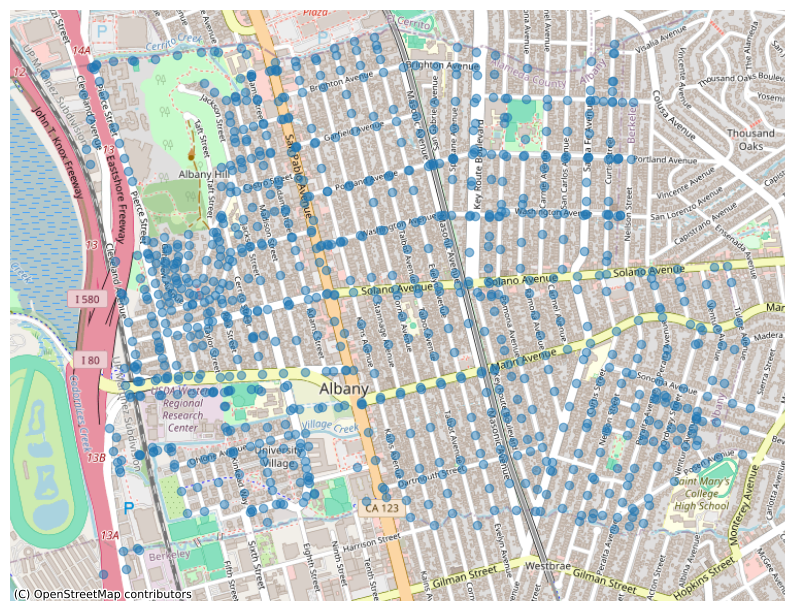

In [26]:
# Create a basemap using contextily
basemap = ctx.providers.OpenStreetMap.Mapnik

# Plot the basemap
ax_manhole = manhole_data.plot(figsize=(10, 10), alpha=0.5)
ctx.add_basemap(ax_manhole, crs=manhole_data.crs, source=basemap)

# Plot the graph on top of the basemap
pos = {node: node for node in G_manhole.nodes()}  # Position the nodes at their coordinates
nx.draw(G_manhole, pos, node_size=10, with_labels=False, node_color='b', edge_color='r', ax=ax_manhole)

plt.show()


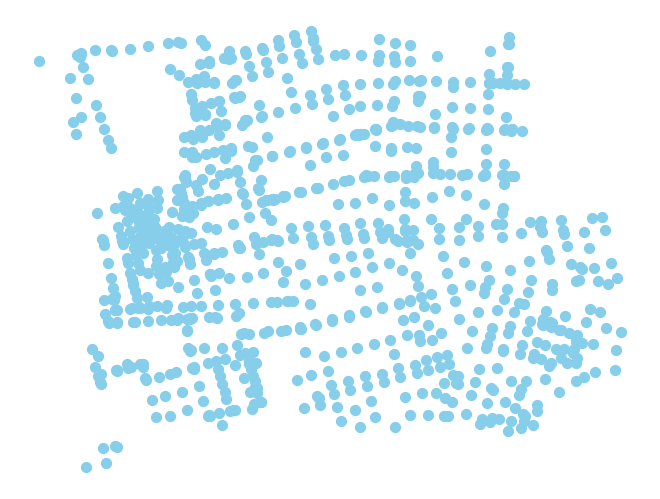

In [27]:
# Create an empty undirected graph
G_manhole = nx.Graph()

# Add nodes from GeoDataFrame rows
for idx, row in manhole_data.iterrows():
    # Extract coordinates from the 'geometry' column
    x, y = row['geometry'].x, row['geometry'].y

    # Add node with node attributes
    G_manhole.add_node(idx, x=x, y=y)

# Visualize the nodes
pos = {(node[0]): (node[1]['x'], node[1]['y']) for node in G_manhole.nodes(data=True)}
nx.draw(G_manhole, pos, with_labels=False, node_size=50, node_color='skyblue')
plt.show()

## alben helped me fix this visualization so it wouldn't show up blank

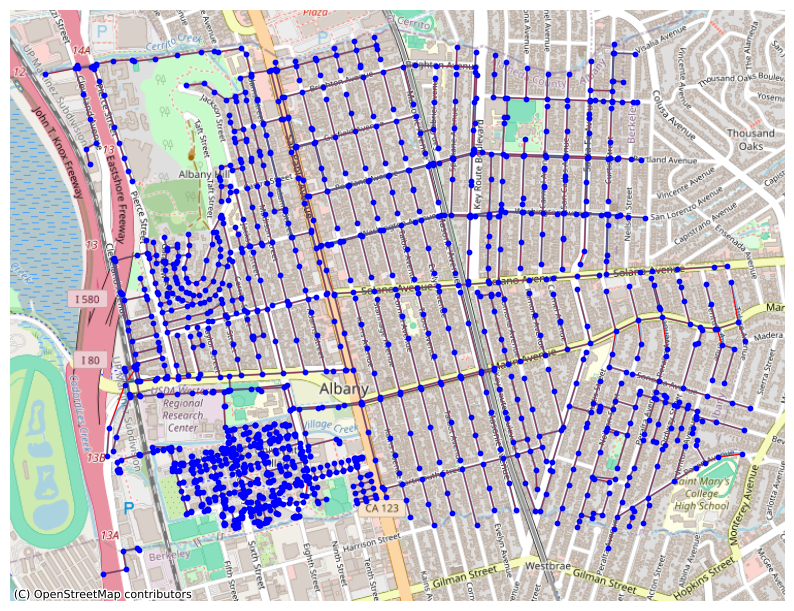

In [28]:
ax_main = main_data.plot(figsize=(10, 10), alpha=0.5)
ctx.add_basemap(ax_main, crs=main_data.crs, source=basemap)

# Plot the graph on top of the basemap
pos = {node: node for node in G_main.nodes()}  # Position the nodes at their coordinates
nx.draw(G_main, pos, node_size=10, with_labels=False, node_color='b', edge_color='r', ax=ax_main)

plt.show()

## these mains serve as the network analyzed below

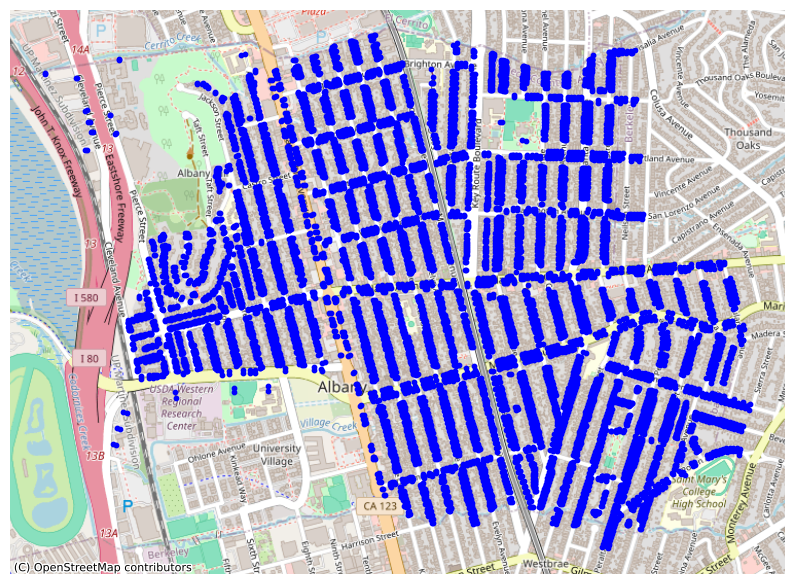

In [29]:
ax_lateral = lateral_data.plot(figsize=(10, 10), alpha=0.5)
ctx.add_basemap(ax_lateral, crs=lateral_data.crs, source=basemap)

# Plot the graph on top of the basemap
pos = {node: node for node in G_lateral.nodes()}  # Position the nodes at their coordinates
nx.draw(G_lateral, pos, node_size=10, with_labels=False, node_color='b', edge_color='r', ax=ax_lateral)

plt.show()

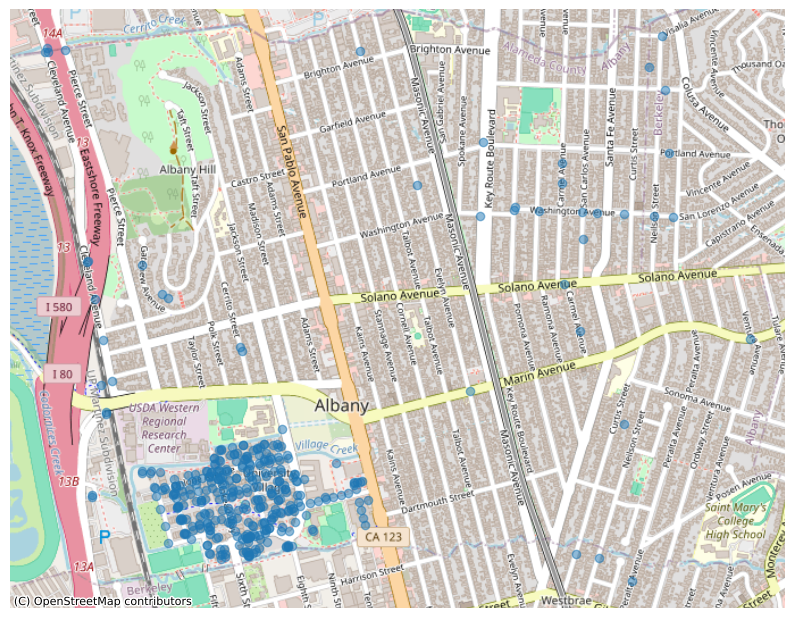

In [30]:
ax_fitting = fitting_data.plot(figsize=(10, 10), alpha=0.5)
ctx.add_basemap(ax_fitting, crs=fitting_data.crs, source=basemap)

# Plot the graph on top of the basemap
pos = {node: node for node in G_fitting.nodes()}  # Position the nodes at their coordinates
nx.draw(G_fitting, pos, node_size=10, with_labels=False, node_color='b', edge_color='r', ax=ax_fitting)

plt.show()

#they seem incomplete, so i'm not analyzing this

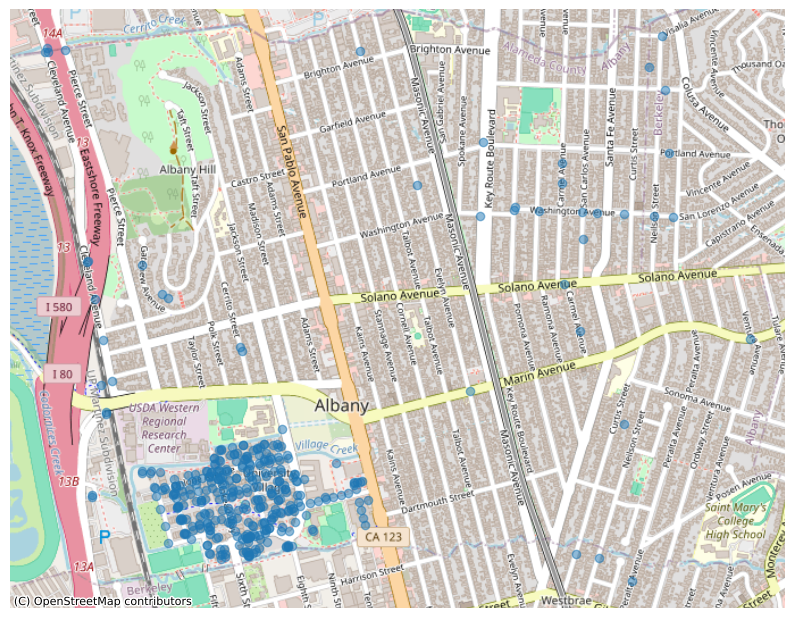

In [ ]:
ax_cleanout = cleanout_data.plot(figsize=(10, 10), alpha=0.5)
ctx.add_basemap(ax_cleanout, crs=cleanout_data.crs, source=basemap)

# Plot the graph on top of the basemap
pos = {node: node for node in G_cleanout.nodes()}  # Position the nodes at their coordinates
nx.draw(G_cleanout, pos, node_size=10, with_labels=False, node_color='b', edge_color='r', ax=ax_cleanout)

plt.show()

#they seem incomplete, so not analyzing

In [32]:
## look into betweenness for the nodes, could be more interesting and highlight the nodes that are the most important to function
## also look into robustness
##weighted vs unweighted --> use pipe diameter as the weights!

In [33]:
#NODES = MANHOLES, LINKS= LATERAL + MAIN

In [34]:
G_main.number_of_nodes()

1469

In [35]:
G_main.number_of_edges()

1481

In [36]:
G_main_sort = sorted(nx.connected_components(G_main), key=len, reverse=True) ## cut out the disconnected parts

In [37]:
G_main_sub = G_main.subgraph(G_main_sort[0]) ##create a subgraph for analysis

In [38]:
print('Average clustering coefficient = ', nx.average_clustering(G_main_sub))
print('Average shortest path length = ', nx.average_shortest_path_length(G_main_sub))
print ("Number of nodes:" , G_main_sub.number_of_nodes())
print ("Number of edges:" , G_main_sub.number_of_edges())
print ("2*Edges/N:" , 2*G_main_sub.number_of_edges()/G_main_sub.number_of_nodes())
print ("Average degree of the graph is = ",np.mean(list(dict(G_main_sub.degree()).values())))
N_nodes= G_main_sub.number_of_nodes()

Average clustering coefficient =  0.0035688793718772305


Average shortest path length =  53.50327521158356
Number of nodes: 1401
Number of edges: 1422
2*Edges/N: 2.0299785867237685
Average degree of the graph is =  2.0299785867237685


In [39]:
# Compute degree
degrees = dict(G_main_sub.degree())
min_degree = min(degrees.values())
max_degree = max(degrees.values())
print(f"Minimum degree: {min_degree}")
print(f"Maximum degree: {max_degree}")

# Compute clustering coefficient
clustering_coeffs = nx.clustering(G_main_sub)
min_clustering = min(clustering_coeffs.values())
max_clustering = max(clustering_coeffs.values())
print(f"Minimum clustering coefficient: {min_clustering}")
print(f"Maximum clustering coefficient: {max_clustering}")

# Compute shortest path length
shortest_path_lengths = dict(nx.shortest_path_length(G_main_sub))
all_lengths = [length for target_lengths in shortest_path_lengths.values() for length in target_lengths.values()]
min_shortest_path = min(all_lengths)
max_shortest_path = max(all_lengths)
print(f"Minimum shortest path length: {min_shortest_path}")
print(f"Maximum shortest path length: {max_shortest_path}")

Minimum degree: 1
Maximum degree: 5
Minimum clustering coefficient: 0
Maximum clustering coefficient: 1.0
Minimum shortest path length: 0
Maximum shortest path length: 150


In [40]:
btwn_main= nx.betweenness_centrality(G_main_sub) #betweenness values of the mains

In [41]:
max_btwn_main_nodes = sorted(btwn_main, key=btwn_main.get, reverse=True)[:10]
max_btwn_main_nodes
##pipes that lead to EB mud are mains
#which nodes have the maximum betweennness values?

[(-13614722.638664942, 4563308.322949956),
 (-13614748.749723107, 4563485.392931214),
 (-13614746.463369202, 4563420.672600914),
 (-13614748.717450866, 4563417.155962496),
 (-13614743.652976055, 4563322.200978941),
 (-13614708.549381444, 4563311.943989032),
 (-13614585.283407604, 4563245.140615916),
 (-13614702.325425208, 4563313.076451983),
 (-13614652.41045974, 4563321.378174732),
 (-13614636.754919548, 4563263.676262882)]

In [42]:
max_btwn_main_vals = [btwn_main[node] for node in max_btwn_main_nodes]
max_btwn_main_vals

#values of the highest betwenness centralities

[0.4796599611967732,
 0.47668487695292555,
 0.4742162769325028,
 0.4738884917798427,
 0.4735586643520882,
 0.4703226794649239,
 0.46979577249055443,
 0.46780251199836614,
 0.46773511692024916,
 0.4671979985704074]

In [43]:
min_btwn_main_nodes = sorted(btwn_main, key=btwn_main.get)[:10]
min_btwn_main_nodes

#which nodes have the minimum betweennness values? (all are zeros)

[(-13613578.571712697, 4562867.457473737),
 (-13612532.39453098, 4563350.528509256),
 (-13614117.177775139, 4564990.956431979),
 (-13612699.621054612, 4563460.500655681),
 (-13614772.416376976, 4564480.737077101),
 (-13615029.289052702, 4564203.743212788),
 (-13613585.231958626, 4564966.546341131),
 (-13612701.291773545, 4563650.272207742),
 (-13612768.573872818, 4564009.796445116),
 (-13613563.918270182, 4563203.064067904)]

In [44]:
min_btwn_main_vals = [btwn_main[node] for node in min_btwn_main_nodes]
min_btwn_main_vals

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

In [45]:
zero_btwn_main_nodes = [node for node in btwn_main if btwn_main[node] == 0]
zero_btwn_main_nodes

#all of the nodes that have a betweenness centrality of zero

[(-13613578.571712697, 4562867.457473737),
 (-13612532.39453098, 4563350.528509256),
 (-13614117.177775139, 4564990.956431979),
 (-13612699.621054612, 4563460.500655681),
 (-13614772.416376976, 4564480.737077101),
 (-13615029.289052702, 4564203.743212788),
 (-13613585.231958626, 4564966.546341131),
 (-13612701.291773545, 4563650.272207742),
 (-13612768.573872818, 4564009.796445116),
 (-13613563.918270182, 4563203.064067904),
 (-13612642.911612187, 4563435.759427406),
 (-13614096.884396063, 4564519.337915959),
 (-13614761.101865651, 4564305.32816343),
 (-13612600.537543599, 4563421.708179295),
 (-13614052.753271135, 4565130.309371545),
 (-13612833.916999321, 4563639.421028779),
 (-13613344.566350305, 4564986.06034706),
 (-13612399.651612494, 4563992.209371941),
 (-13612815.995422106, 4564559.222023578),
 (-13612648.147454495, 4563262.408320776),
 (-13613494.320134012, 4565046.568521697),
 (-13612819.823360572, 4563489.698157812),
 (-13614912.566993805, 4563942.387564459),
 (-13612708.37

In [46]:
## what does a betweenness centrality of zero mean?

In [47]:
avg_btwn_main = sum(btwn_main.values()) / len(btwn_main)
avg_btwn_main

0.037529145969680884

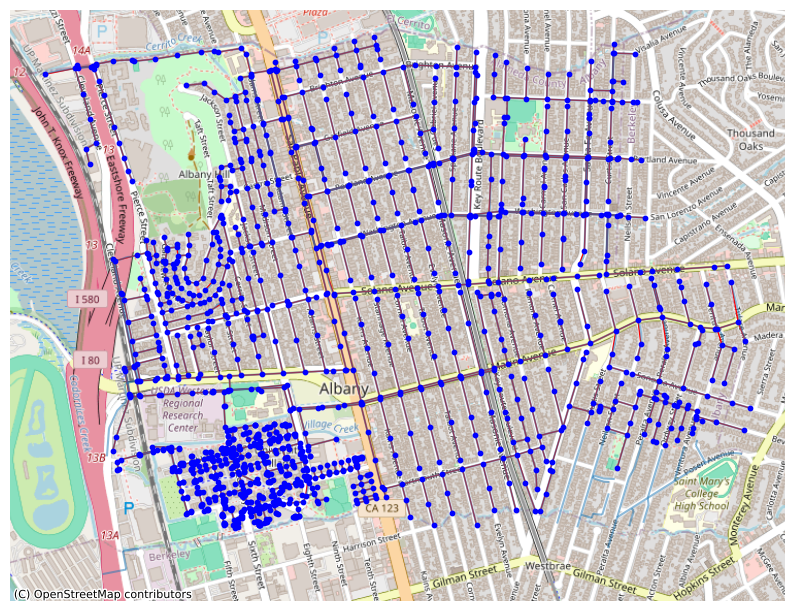

In [48]:
ax_main = main_data.plot(figsize=(10, 10), alpha=0.5)
ctx.add_basemap(ax_main, crs=main_data.crs, source=basemap)

# Plot the graph on top of the basemap

pos = {node: node for node in G_main_sub.nodes()}  # Position the nodes at their coordinates
nx.draw(G_main_sub, pos, node_size=10, with_labels=False, node_color='b', edge_color='r', ax=ax_main)

plt.show()

## these mains serve as the network analyzed below, this is the largest connected component

In [ ]:
import networkx as nx
from networkx.generators import *
import numpy as np
import matplotlib.pyplot as plt


#Computing betweeness
betCent = nx.betweenness_centrality(G_main_sub, normalized=True, endpoints=True)

#Descending order sorting betweeness
betCent_sorted=dict(sorted(betCent.items(), key=lambda item: item[1],reverse=True))


#Color and size for regular nodes
color_list= N_nodes*['lightsteelblue'] ##make the original nodes blue
size_list= N_nodes*[5]

## nodes' indices are properly formatted here
node_indices = {node: idx for idx, node in enumerate(G_main_sub.nodes())} #

In [ ]:
#Getting indices on top 10 nodes for each measure
N_top=10

keys_bet_top=list(betCent_sorted)[0:N_top]

pos = {node: node for node in G_main_sub.nodes()}  # Position the nodes at their coordinates
betCent_sorted_coord = {(pos[node][0], pos[node][1]): node_indices[node] for node in keys_bet_top}

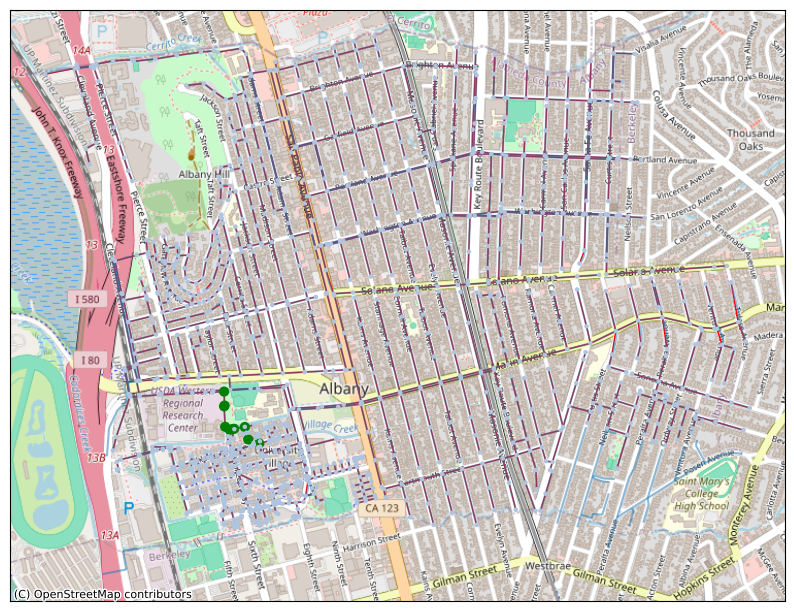

In [51]:
#Setting up color for nodes

for node_bet in betCent_sorted_coord:
  node_index = node_indices[node_bet]
  color_list[node_index] = 'g'  # make the high betweenness centrality nodes green
  size_list[node_index] = 40  # set the size to 40 for nodes with high betweenness centrality
    # color_list[node_indices[node_bet]] = 'g' ##make the high betweenness centrality nodes green
    # size_list = 40
#Draw graph

ax_main = main_data.plot(figsize=(10, 10), alpha=0.5)
ctx.add_basemap(ax_main, crs=main_data.crs, source=basemap)

pos = {node: node for node in G_main_sub.nodes()}  # Position the nodes at their coordinates
nx.draw_networkx_nodes(G_main_sub, pos, node_size=size_list, node_color=color_list)
nx.draw_networkx_edges(G_main_sub, pos, edge_color='r')

## Targetted Attacks

Top 10 Betweenness Centrality

In [52]:
betCent_sorted_coord

{(-13614722.638664942, 4563308.322949956): 927,
 (-13614748.749723107, 4563485.392931214): 427,
 (-13614746.463369202, 4563420.672600914): 797,
 (-13614748.717450866, 4563417.155962496): 926,
 (-13614743.652976055, 4563322.200978941): 925,
 (-13614708.549381444, 4563311.943989032): 929,
 (-13614585.283407604, 4563245.140615916): 886,
 (-13614702.325425208, 4563313.076451983): 998,
 (-13614652.41045974, 4563321.378174732): 890,
 (-13614636.754919548, 4563263.676262882): 974}

In [53]:
C = G_main_sub.copy()
N = G_main_sub.number_of_nodes()

total_nodes_removed = 10
number_of_steps = N // total_nodes_removed

num_nodes_removed = range(0, N, number_of_steps)

targeted_attack_core_proportions = []
for nodes_removed in num_nodes_removed:
    # Measure the relative size of the network core
    core = max(nx.connected_components(C), key=len)
    core_proportion = len(core) / N

    targeted_attack_core_proportions.append(core_proportion)
    # If there are more than M nodes, select top M nodes and remove them
    if C.number_of_nodes() > total_nodes_removed:
        nodes_to_remove = max_btwn_main_nodes
        C.remove_nodes_from(nodes_to_remove)

In [54]:

# N = G_main_sub.number_of_nodes()

total_nodes_removed = 10

targeted_attack_core_proportions = []


## i am using the vector max_btwn_main_nodes because it is WITHOUT the index.
# the vector WITH the index was only useful previously for plotting.

for node in max_btwn_main_nodes:
    #make the copy in the loop so that each iteration starts with the original graph
    C = G_main_sub.copy()

    #removes current node from the graph if it is present
    if C.has_node(node):
        C.remove_node(node)

# Measure the relative size of the network core
    core = max(nx.connected_components(C), key=len)
    core_proportion = len(core) / len(C)

    targeted_attack_core_proportions.append(core_proportion)

    # if len(C) > total_nodes_removed:
    #     nodes_to_remove = max_btwn_main_nodes[:total_nodes_removed]
    #     C.remove_nodes_from(nodes_to_remove)


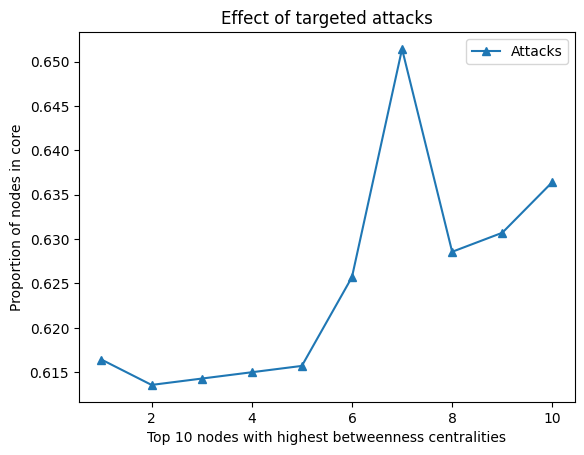

In [55]:
plt.title('Effect of targeted attacks')
plt.xlabel('Top 10 nodes with highest betweenness centralities')
plt.ylabel('Proportion of nodes in core')
plt.plot(range(1,11,1), targeted_attack_core_proportions, marker='^', label='Attacks')
plt.legend(loc=2, prop={'size': 10})
plt.legend()

In [56]:
betCent_sorted_coord

{(-13614722.638664942, 4563308.322949956): 927,
 (-13614748.749723107, 4563485.392931214): 427,
 (-13614746.463369202, 4563420.672600914): 797,
 (-13614748.717450866, 4563417.155962496): 926,
 (-13614743.652976055, 4563322.200978941): 925,
 (-13614708.549381444, 4563311.943989032): 929,
 (-13614585.283407604, 4563245.140615916): 886,
 (-13614702.325425208, 4563313.076451983): 998,
 (-13614652.41045974, 4563321.378174732): 890,
 (-13614636.754919548, 4563263.676262882): 974}

Entire network

In [57]:
N = G_main_sub.number_of_nodes()
number_of_steps = 50
M = N // number_of_steps

num_nodes_removed = range(0, N, M)
C = G_main_sub.copy()
targeted_attack_core_proportions = []
for nodes_removed in num_nodes_removed:
    # Measure the relative size of the network core
    core = max(nx.connected_components(C), key=len)
    core_proportion = len(core) / N
    targeted_attack_core_proportions.append(core_proportion)

    # If there are more than M nodes, select top M nodes and remove them
    if C.number_of_nodes() > M:
        nodes_sorted_by_degree = sorted(C.nodes, key=C.degree, reverse=True)
        nodes_to_remove = nodes_sorted_by_degree[:M]
        C.remove_nodes_from(nodes_to_remove)

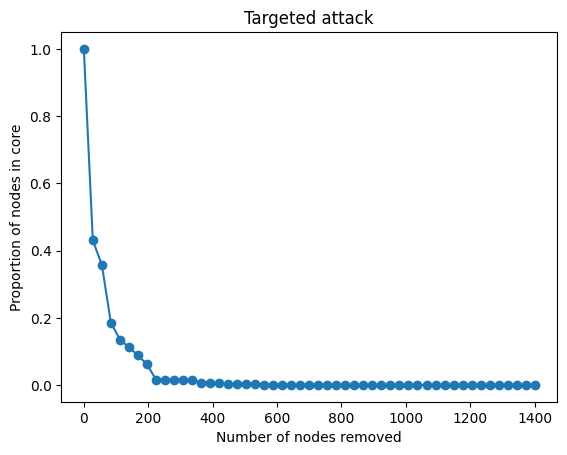

In [58]:
plt.title('Targeted attack')
plt.xlabel('Number of nodes removed')
plt.ylabel('Proportion of nodes in core')
plt.plot(num_nodes_removed, targeted_attack_core_proportions, marker='o')

In [59]:
#### REMOVAL OF RANKED NODE 2
G_modified = nx.Graph()
coordinate_to_remove = (-13614748.749723107, 4563485.392931214)

for geometry in main_data['geometry']:
    if geometry.geom_type == 'LineString':
        coordinates_main = list(geometry.coords)

        # Extract the start and end coordinates
        start_coord = coordinates_main[0]
        end_coord = coordinates_main[-1]

        # Add an edge between start and end coordinates
        G_modified.add_edge(start_coord, end_coord)

if G_modified.has_node(coordinate_to_remove):
    # Remove the node from the graph
    G_modified.remove_node(coordinate_to_remove)

    # Remove the corresponding row from the DataFrame
    main_data = main_data[~((main_data['geometry'].apply(lambda x: x.coords[0] == coordinate_to_remove)) |
                           (main_data['geometry'].apply(lambda x: x.coords[-1] == coordinate_to_remove)))]


In [60]:
G_modified_sort = sorted(nx.connected_components(G_modified), key=len, reverse=True) ## cut out the disconnected parts

In [61]:
G_modified_sub = G_modified.subgraph(G_modified_sort[0])

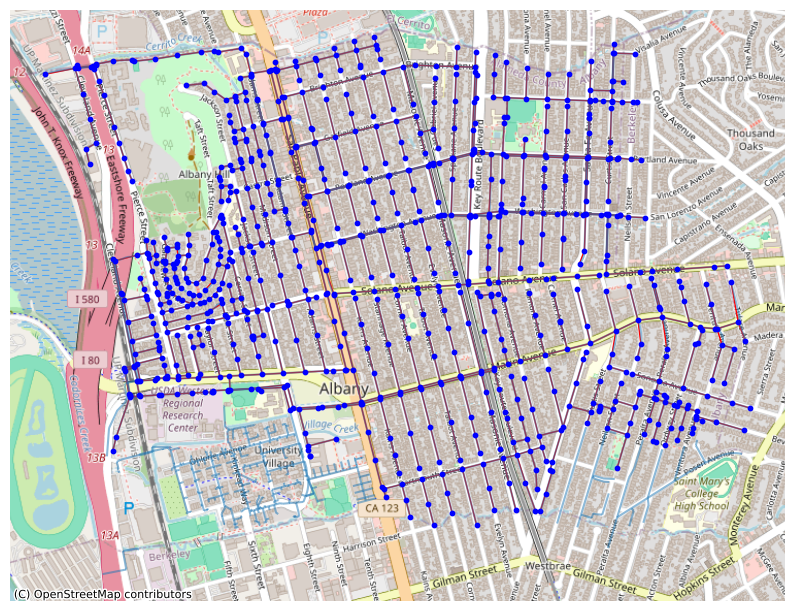

In [62]:
ax_main = main_data.plot(figsize=(10, 10), alpha=0.5)
ctx.add_basemap(ax_main, crs=main_data.crs, source=basemap)

# Plot the graph on top of the basemap

pos = {node: node for node in G_modified_sub.nodes()}  # Position the nodes at their coordinates
nx.draw(G_modified_sub, pos, node_size=10, with_labels=False, node_color='b', edge_color='r', ax=ax_main)

plt.show()

## these mains serve as the network analyzed below, this is the largest connected component

In [ ]:
#### REMOVAL OF RANKED NODE 3 - not much different from node 2
G_modified = nx.Graph()
coordinate_to_remove = (-13614746.463369202, 4563420.672600914)

for geometry in main_data['geometry']:
    if geometry.geom_type == 'LineString':
        coordinates_main = list(geometry.coords)

        # Extract the start and end coordinates
        start_coord = coordinates_main[0]
        end_coord = coordinates_main[-1]

        # Add an edge between start and end coordinates
        G_modified.add_edge(start_coord, end_coord)

if G_modified.has_node(coordinate_to_remove):
    # Remove the node from the graph
    G_modified.remove_node(coordinate_to_remove)

    # Remove the corresponding row from the DataFrame
    main_data = main_data[~((main_data['geometry'].apply(lambda x: x.coords[0] == coordinate_to_remove)) |
                           (main_data['geometry'].apply(lambda x: x.coords[-1] == coordinate_to_remove)))]

In [64]:
G_modified_sort = sorted(nx.connected_components(G_modified), key=len, reverse=True) ## cut out the disconnected parts

In [65]:
G_modified_sub = G_modified.subgraph(G_modified_sort[0])

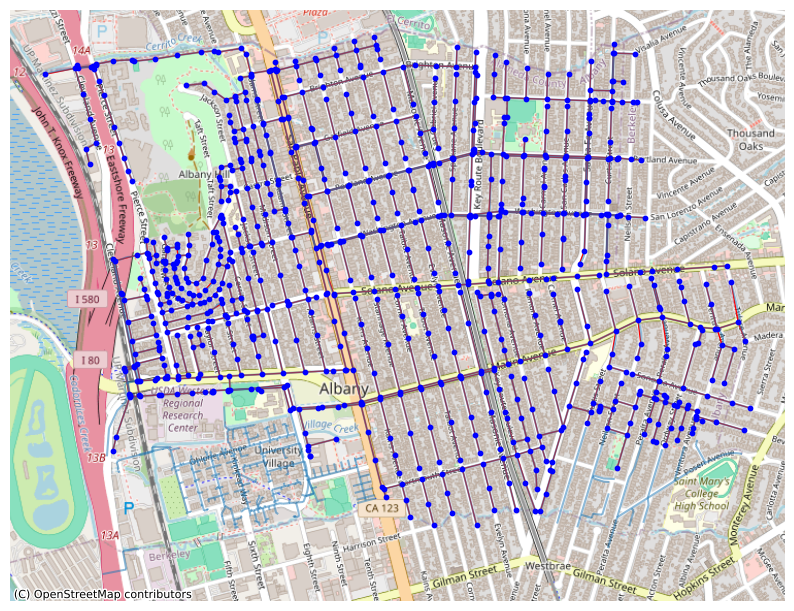

In [66]:
ax_main = main_data.plot(figsize=(10, 10), alpha=0.5)
ctx.add_basemap(ax_main, crs=main_data.crs, source=basemap)

# Plot the graph on top of the basemap

pos = {node: node for node in G_modified_sub.nodes()}  # Position the nodes at their coordinates
nx.draw(G_modified_sub, pos, node_size=10, with_labels=False, node_color='b', edge_color='r', ax=ax_main)

plt.show()

## these mains serve as the network analyzed below, this is the largest connected component